In [1]:
import plotly
import numpy as np 
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt 
import os
import glob
#from sklearn.neighbors import NearestNeighbors

In [2]:
df=pd.read_pickle("reweighted2.pkl")
df

,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,0,3.838186,5.311395e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,0,1.000000e+00
1,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,1,3.894404,4.795416e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,1,1.000000e+00
2,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,2,3.947743,4.486119e-01,"[0.2485583871603012, 0.5979032516479492, 0.201...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,2,1.000000e+00
3,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,3,4.041379,4.824570e-01,"[-0.12910380959510803, 0.49059078097343445, 0....",-1.000000,md_run_2_1709847450,2,441,1.709847e+09,NaN,NaN,NaN,3,1.000000e+00
4,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,4,4.067689,4.975551e-01,"[0.2707480788230896, 0.4690714478492737, 0.528...",-1.000000,md_run_2_1709847450,2,487,1.709847e+09,NaN,NaN,NaN,4,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028995,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,995,7.538620,1.175796e-20,"[-0.48277848958969116, 0.3115301728248596, 0.5...",-1.000000,md_run_7_1710304265,7,310,1.710304e+09,md_run_7_1710301593,NaN,NaN,171995,5.534173e-30
1028996,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,996,7.622481,7.734367e-21,"[-0.30358684062957764, 0.23337039351463318, 0....",-1.025333,md_run_7_1710304265,7,310,1.710304e+09,md_run_7_1710301593,NaN,NaN,171996,5.534173e-30
1028997,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,997,7.734472,1.222995e-20,"[-0.30083298683166504, 0.015502158552408218, 0...",-1.299760,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171997,5.534173e-30
1028998,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,998,7.671970,4.933934e-21,"[-0.047341570258140564, 0.10725318640470505, 0...",-1.369596,md_run_7_1710304265,7,136,1.710304e+09,md_run_7_1710301593,NaN,NaN,171998,5.534173e-30


In [ ]:
df[::10]

In [ ]:
df.md_step.max()

In [ ]:
df=df[df.md_step<100000]

In [ ]:
df2=pd.read_pickle("df_kmeans_mod.pkl")
df2

In [ ]:
df3=pd.read_pickle("df_kmeans.pkl")
df3

In [ ]:
df['mod']=df3['mod']

In [ ]:
df['pdb'].iloc[0]

In [ ]:
embed=np.array(df['embeddings'].values.tolist())
RMSD= np.array(df['rmsd'].values.tolist())*0.1
LOF= np.array(df['lof_score'].values.tolist())

Q_df= np.array(df['Q'].values.tolist())    # all frames
weights= np.array(df['weight'].values.tolist())    # all frames
Q_df0= np.array(df['Q'][df.frame==0].values.tolist())   # only 1st frame of each dcd
LOF0= np.array(df['lof_score'][df.frame==0].values.tolist())   # only 1st frame of each dcd

In [ ]:
print(embed.shape[1]) # dimensionality of latent space
print(embed.shape)

In [ ]:
dimensions=[]
for i in range(embed.shape[1]):
    df[f'x{i+1}'] = [row[i] for row in embed]
    dimensions.append(f'x{i+1}')
df

In [ ]:
fig = px.scatter_matrix(df.iloc[::20, :],
    dimensions=dimensions,
    color="rmsd")
fig.show()
fig.write_html("rmsd.html")

In [ ]:
fig = px.scatter_matrix(df.iloc[::10, :],
    dimensions=dimensions,
    color="mod")
fig.show()
fig.write_html("mod.html")

In [3]:
df100=df[::20]
df100

,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,0,3.838186,5.311395e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,0,1.000000e+00
20,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,20,4.342980,4.417213e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,20,1.000000e+00
40,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,40,3.981660,3.755004e-01,"[0.026310540735721588, 0.4881913363933563, 0.2...",0.000000,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,40,1.000000e+00
60,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,60,3.752284,4.196723e-01,"[0.0014665648341178894, 0.47951826453208923, 0...",-1.000000,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,60,1.000000e+00
80,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,80,3.775409,4.373400e-01,"[-0.02867097035050392, 0.6261557340621948, 0.4...",-1.002567,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,80,5.000000e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028900,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,900,9.660084,9.728210e-32,"[-0.22712741792201996, 0.3766804039478302, 0.7...",-1.000000,md_run_7_1710304265,7,2,1.710304e+09,md_run_7_1710301593,NaN,NaN,171900,5.534173e-30
1028920,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,920,8.845157,4.794787e-30,"[-0.5459446310997009, 0.3597353398799896, 0.71...",-1.000000,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171920,5.534173e-30
1028940,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,940,8.593498,7.217125e-25,"[-0.29301321506500244, 0.08565234392881393, 0....",-1.000000,md_run_7_1710304265,7,284,1.710304e+09,md_run_7_1710301593,NaN,NaN,171940,5.534173e-30
1028960,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,960,8.426204,1.164327e-25,"[-0.5459446310997009, 0.3597353398799896, 0.71...",-1.000000,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171960,5.534173e-30


In [ ]:
embed10=np.array(df10['embeddings'].values.tolist())

from sklearn.manifold import TSNE
SEED = 42
np.random.seed(SEED)

tsne = TSNE(n_components=2, perplexity=50, random_state=SEED,n_iter=500)
tsne_result = tsne.fit_transform(embed10)
tsne_result.shape

In [4]:
import umap
#from umap import UMAP

embed10=np.array(df100['embeddings'].values.tolist())
umap_model = umap.UMAP(n_components=2,min_dist=0.0,n_neighbors=50,metric='euclidean',random_state=42)
umap_embeddings = umap_model.fit_transform(embed10)
umap_embeddings.shape

/home/agupta55/.local/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(51450, 2)

In [5]:
df100['umap1']=(umap_embeddings[:,0])
df100['umap2']=(umap_embeddings[:,1])
df100

/tmp/ipykernel_2985613/448890114.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df100['umap1']=(umap_embeddings[:,0])
/tmp/ipykernel_2985613/448890114.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df100['umap2']=(umap_embeddings[:,1])


,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight,umap1,umap2
0,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,0,3.838186,5.311395e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,0,1.000000e+00,11.140516,16.583834
20,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,20,4.342980,4.417213e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,20,1.000000e+00,11.140688,16.584007
40,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,40,3.981660,3.755004e-01,"[0.026310540735721588, 0.4881913363933563, 0.2...",0.000000,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,40,1.000000e+00,10.255774,1.534380
60,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,60,3.752284,4.196723e-01,"[0.0014665648341178894, 0.47951826453208923, 0...",-1.000000,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,60,1.000000e+00,10.306425,1.462275
80,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,80,3.775409,4.373400e-01,"[-0.02867097035050392, 0.6261557340621948, 0.4...",-1.002567,md_run_2_1709847450,2,352,1.709847e+09,NaN,NaN,NaN,80,5.000000e-01,10.136664,1.567346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028900,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,900,9.660084,9.728210e-32,"[-0.22712741792201996, 0.3766804039478302, 0.7...",-1.000000,md_run_7_1710304265,7,2,1.710304e+09,md_run_7_1710301593,NaN,NaN,171900,5.534173e-30,0.285625,-3.648244
1028920,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,920,8.845157,4.794787e-30,"[-0.5459446310997009, 0.3597353398799896, 0.71...",-1.000000,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171920,5.534173e-30,-1.381822,-7.048258
1028940,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,940,8.593498,7.217125e-25,"[-0.29301321506500244, 0.08565234392881393, 0....",-1.000000,md_run_7_1710304265,7,284,1.710304e+09,md_run_7_1710301593,NaN,NaN,171940,5.534173e-30,0.271818,-3.586684
1028960,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,960,8.426204,1.164327e-25,"[-0.5459446310997009, 0.3597353398799896, 0.71...",-1.000000,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171960,5.534173e-30,-1.381834,-7.048693


In [ ]:
for i in range(tsne_result.shape[1]):
    df10[f'tsne{i+1}'] = [row[i] for row in tsne_result]
df10.to_pickle("tsne10.pkl")
df10

In [ ]:
df_rg=pd.read_pickle("tsne_Rg.pkl")
df_rg

In [ ]:
df10['tsne1']=df_rg['tsne1']
df10['tsne2']=df_rg['tsne2']
df10['Rg']=df_rg['Rg']
df10

In [ ]:
df10=pd.read_pickle("tsne_physical.pkl")
df10

In [ ]:
df10["mod"] = df["mod"].astype(str)
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="mod",
                   size_max=2,width=480, height=450)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='Mod', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_mod.html")

In [6]:
df100['rmsd']=df100['rmsd']*0.1

/tmp/ipykernel_2985613/1936750546.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df100['rmsd']=df100['rmsd']*0.1


In [ ]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="rmsd",
                   size_max=2,width=530, height=400)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='RMSD (nm)', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_rmsd.html")

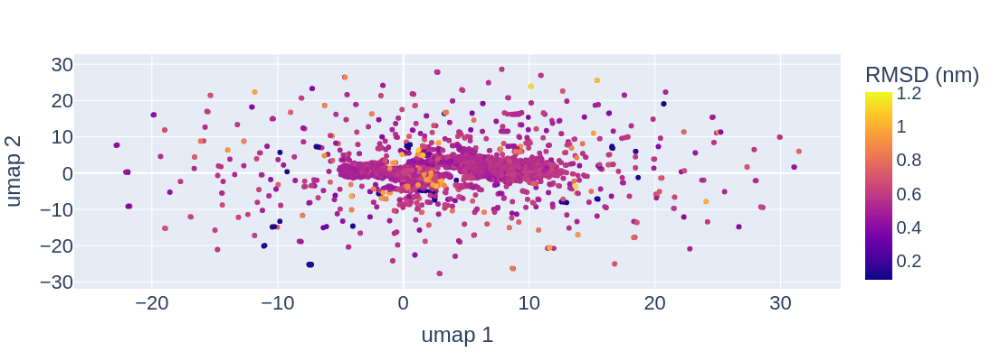

In [9]:
fig = px.scatter(df100, 
                    x="umap1", y="umap2", 
                    color="rmsd",
                   size_max=2,width=530, height=400)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='RMSD (nm)', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='umap 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='umap 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("umap_rmsd.html")

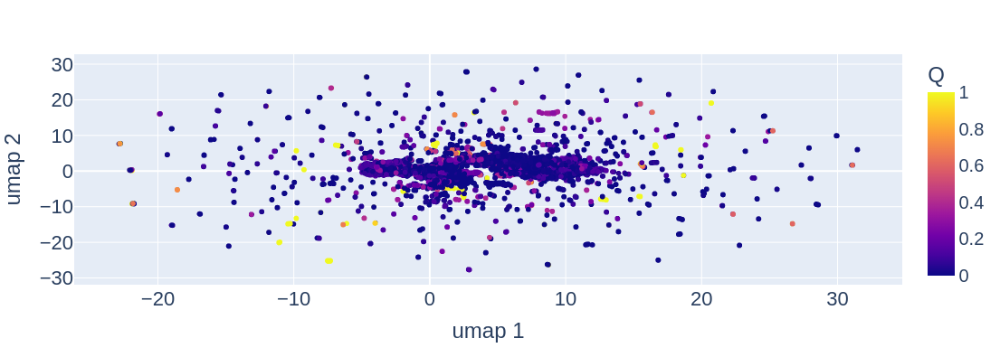

In [10]:
fig = px.scatter(df100, 
                    x="umap1", y="umap2", 
                    color="Q",
                   size_max=2,width=450, height=395)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='Q', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='umap 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='umap 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("umap_Q.html")

In [ ]:
df10["Stackings"] = df10["Stackings"].astype(int).astype(str)
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="Stackings",
                   size_max=2,width=450, height=400)
fig.show()
#fig.write_html("tsne_stackings.html")

In [ ]:
df10["Pairings"] = df10["Pairings"].astype(int).astype(str)
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="Pairings",
                   size_max=2,width=450, height=400)
fig.show()
#fig.write_html("tsne_pairings.html")

In [ ]:
df_pair10=df10[(df10.Pairings!='0') & (df10.Pairings!='1')]
fig = px.scatter(df_pair10, 
                    x="tsne1", y="tsne2", 
                    color="Pairings",
                   size_max=2,width=450, height=400)
fig.show()

In [ ]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="Rg",
                   size_max=2,width=450, height=400)
fig.show()
fig.write_html("tsne_Rg.html")

In [8]:
df100.to_pickle("umap_20.pkl")

In [ ]:
fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(RMSD, bins = 300)
#custom_ticks = np.linspace(0, 5.5, 11)  # Define positions for ticks
#custom_labels = ['0.5','1.0', '1.5', '2.0', '2.5', '3.0','3.5','4.0','4.5','5.0','5.5']  # Define labels for these positions
#plt.xticks(custom_ticks, custom_labels)  # Set the custom ticks and labels on the x-axis
plt.xticks(np.arange(0, max(RMSD), step=0.2),fontsize = 28)
plt.yticks(fontsize = 28)
plt.xlabel("RMSD (nm)",fontsize = 30) 
plt.ylabel("Histogram count",fontsize = 30)
plt.title("DDMD",fontsize = 32) 
# Show plot
plt.show()

In [ ]:
max(RMSD)

In [ ]:
sub_ldf=df[df.lof_score > -3]
#sub_ldf= sldf[sldf.lof_score < -1.3]

In [ ]:
plt.hist(df['Q'], bins=300, log=True)
plt.xlabel("Q") 
plt.ylabel("log Histogram count")
plt.title("Frames having |LOF| > 90")
 
# Show plot
plt.show()

In [ ]:
plt.hist(sub_ldf['rmsd'], bins=300, log=True)
plt.xlabel("RMSD (A)") 
plt.ylabel("log Histogram count")
plt.title("Frames having |LOF| > 90")
 
# Show plot
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(sub_ldf['Q'], bins = 500)
plt.xlabel("Q") 
 
# Show plot
plt.show()

In [ ]:
print(sub_ldf['Q'].max())
print(sub_ldf['Q'].min())

In [ ]:
plt.hist(LOF, bins=500, log=True)
plt.xlabel("LOF") 
plt.ylabel("log Histogram count")
 
# Show plot
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(LOF, bins = 500)
plt.xlabel("LOF") 
 
# Show plot
plt.show()

##### Plot of outlier RMSDs i.e. RMSD of first frame of every trajectory

In [ ]:
sub_df = df[df.frame == 0]
RMSD_first_frame=np.array(sub_df['rmsd'].values.tolist())
y=range(1, len(RMSD)+1)

plt.title("0.5_f")
plt.xlabel("RMSD (A)")
plt.ylabel("MD Simulation no. i.e. progress of simulation in time")
plt.plot(RMSD, y)
plt.show()

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(RMSD_first_frame, bins = 100)
plt.title("Histogram")
plt.xlabel("RMSD of first frame (A)") 
# Show plot
plt.show()

In [ ]:
len(df.y)

In [ ]:
df.y.min()

In [ ]:
df.z.max()

#### store the Q values of all frames

In [ ]:
Q= np.array([])   # to store Q's of completed trjectories
Q0= np.array([])   # to store Q's of the first frames (i.e. the selected outliers) of the completed trajectories
md_path="../md_run"
for md in sorted(glob.glob(f"{md_path}/md_run*")):
    if os.path.exists(md+"/DONE"):
        q=np.loadtxt(md + "/colvar", comments=["#","@"])[:,1]   # Q's of one dcd
        q0= np.loadtxt(md + "/colvar", comments=["#","@"])[0,1]   # Q of 1st frame of one dcd
        Q= np.append(Q,q)
        Q0= np.append(Q0,q0)

In [ ]:
Q.sort()
Q

In [ ]:
g=[3,4,5,6,2,3,89,12,23]
np.ptp(g)    # the range of array

In [ ]:
LOF.sort()
LOF

In [ ]:
df.iloc[df.lof_score.argmin()]['lof_score']    # traj having lowest LOF

In [ ]:
plt.hist(LOF0, bins=300, log=True)
plt.xlabel("LOF") 
plt.ylabel("log Histogram count")
plt.title("Outlier frames")
 
# Show plot
plt.show()

In [ ]:
Q_df.sort()
Q_df

In [ ]:
sub_df = df[df.frame == 0]    # first frames i.e. outliers
ssdf=sub_df[sub_df.Q < 0.75]

In [ ]:
df.iloc[14000]['dcd']

In [ ]:
df.iloc[df.Q.argmin()]['dcd']    # traj having lowest Q

In [ ]:
sub_df = df[df.dcd == '/project/zerze/ayushg/argonne/ddmd/rna2/test_C1_or_C3_Qnudge_ld6_IC_f_0.gro/md_run/md_run_3_1689936796/output.dcd']
sub_df

In [ ]:
print(Q)
print(Q_df)

##### Plot of outlier RMSDs and Q's i.e. RMSD/Q of first frame of every trajectory

In [ ]:
sub_df = df[df.frame == 0]
RMSD_first_frame=np.array(sub_df['rmsd'].values.tolist())
LOF_first_frame=np.array(sub_df['lof_score'].values.tolist())
y=range(1, len(Q_df0)+1)

plt.title("No nudge, ld_6, C1' and C3', IC: f_0.gro")
plt.xlabel("Q of first frame")
plt.ylabel("MD Simulation no. i.e. progress of simulation in time")
plt.plot(Q_df0, y)
plt.show()

plt.xlabel("RMSD of first frame (A)")
plt.ylabel("Q of first frame")
plt.scatter(RMSD_first_frame, Q_df0, c=LOF_first_frame)
plt.colorbar(label="LOF score")
plt.show()

In [ ]:
print(np.shape(Q))

In [ ]:
print(np.shape(Q0))

In [ ]:
Q.min()

In [ ]:
print(Q.argmax())

In [ ]:
print(Q[1235])

In [ ]:
indices = [idx for idx,val in enumerate(Q) if 0.75 < val < 0.751]
print(indices)

In [ ]:
# to extract a particular frame from a dcd

import MDAnalysis as mda

loc=df.iloc[1235]
u=mda.Universe(loc['pdb'],loc['dcd'])
u.trajectory[loc['frame']]
u.atoms.write("/project/zerze/ayushg/argonne/configs/ICs/Q_loc.gro")

#### to see how many md_runs were fully completed

In [ ]:
hell=0

for md in glob.glob(f"{md_path}/md_run*"):
    if os.path.exists(md+"/DONE"): hell+=1
print(hell)

In [ ]:
from scipy import interpolate
from scipy.ndimage import gaussian_filter

In [ ]:
kb=0.00831446 # kJ/mol/K
temperature=300 # K
beta=1./(kb*temperature)

### ESS for PTWTE-WTM at 300 K

In [ ]:
data=np.genfromtxt("/project/zerze/ayushg/argonne/ddmd/analysis/FED/colvar_PTWTE_WTM_Gul")
ignore=25000
time=np.copy(data[ignore:,16])
energy=np.copy(data[ignore:,1])
bias=np.copy(data[ignore:,3]+data[ignore:,9]+data[ignore:,12]+data[ignore:,14])
cmap=np.copy(data[ignore:,7])
rmsd=np.copy(data[ignore:,17])

logweights2 = beta*bias
logweights2 -= np.amax(logweights2)
weights2 = np.exp(logweights2)

rmsd_lim_min=min(min(rmsd),min(RMSD))
rmsd_lim_max=max(max(rmsd),max(RMSD))

H2, xedges1, yedges1 = np.histogram2d(cmap, rmsd, weights=weights2, bins=(120,120),range=[[0.01,0.99],[rmsd_lim_min,rmsd_lim_max]])
H2 = H2.T
H2=-(1/beta)*np.log(gaussian_filter(H2, sigma=3))
H2 -= np.amin(H2) 

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H2, vmin=0,vmax=50)
plt.colorbar()
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, H2 ,np.arange(0,55,5),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

In [ ]:
max(rmsd),max(RMSD), min(RMSD)

### DDMD FES

In [ ]:
# Q and RMSD

H1, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, weights=weights, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.figure(figsize=(4.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=50)
#plt.colorbar(label="kJ/mol")
#colorbar = plt.colorbar()
#colorbar.set_label(label='kJ/mol',size=18)
#colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,25,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
#plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: Q=0.5, 8 A cut-off. 100000 mdsteps")
plt.tick_params(axis='x', labelsize=20)
plt.xticks(np.arange(0, 1.2,0.25))
plt.yticks(np.arange(0, 1.3,0.2))
plt.tick_params(axis='y', labelsize=20)
plt.show()

### Delta F; F(DDMD) -F (WTM)

In [ ]:
# Error
DH = np.sqrt((H1-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)

plt.figure(figsize=(4.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

#plt.colorbar(label="kJ/mol")
#colorbar = plt.colorbar()
#colorbar.set_label(label='kJ/mol',size=18)
#colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,25,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.title('DDMD')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.xticks(np.arange(0, 1.2,0.25))
plt.yticks(np.arange(0, rmsd_lim_max,0.2))
plt.show()

### to pick trajectories having a folded frame and then checking the distribution of all frames of those trajectories

In [ ]:
df_has_F = pd.DataFrame()
for label in df.sys_label.unique():
    sdf=df[df.sys_label==label]
    if ((sdf['Q']>0.9) & (sdf['rmsd']<2)).any():      # if the trajectory contains any folded frame
        df_has_F=pd.concat([df_has_F, sdf], ignore_index = True)
df_has_F

In [ ]:
RMSD_has_F= np.array(df_has_F['rmsd'].values.tolist())*0.1
Q_has_F= np.array(df_has_F['Q'].values.tolist())    # all frames

In [ ]:
RMSD_has_F.max()

In [ ]:
H1, xedges1, yedges1 = np.histogram2d(Q_has_F, RMSD_has_F, bins=(120,120),range=[[Q_has_F.min(),Q_has_F.max()],[RMSD_has_F.min(),RMSD_has_F.max()]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.figure(figsize=(5.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=50)
#plt.colorbar(label="kJ/mol")
colorbar = plt.colorbar()
colorbar.set_label(label='kJ/mol',size=18)
colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([Q_has_F.min(),Q_has_F.max()])
plt.ylim([RMSD_has_F.min(),RMSD_has_F.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
#plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: Q=0.5, 8 A cut-off. 100000 mdsteps")
plt.tick_params(axis='x', labelsize=20)
plt.xticks(np.arange(0.5, 1,0.1))
plt.yticks(np.arange(0, 0.31,0.05))
plt.tick_params(axis='y', labelsize=20)
plt.show()

### to pick trajectories having a misfolded frame and then checking the distribution of all frames of those trajectories

In [ ]:
df_has_F = pd.DataFrame()
for label in df.sys_label.unique():
    sdf=df[df.sys_label==label]
    if ((sdf['Q']>0.9) & (sdf['rmsd']<4) & (sdf['rmsd']>3)).any():      # if the trajectory contains any misfolded frame
        df_has_F=pd.concat([df_has_F, sdf], ignore_index = True)
df_has_F

In [ ]:
RMSD_has_F= np.array(df_has_F['rmsd'].values.tolist())*0.1
Q_has_F= np.array(df_has_F['Q'].values.tolist())    # all frames

H1, xedges1, yedges1 = np.histogram2d(Q_has_F, RMSD_has_F, bins=(120,120),range=[[Q_has_F.min(),Q_has_F.max()],[RMSD_has_F.min(),RMSD_has_F.max()]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.figure(figsize=(5.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=50)
#plt.colorbar(label="kJ/mol")
colorbar = plt.colorbar()
colorbar.set_label(label='kJ/mol',size=18)
colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([Q_has_F.min(),Q_has_F.max()])
plt.ylim([RMSD_has_F.min(),RMSD_has_F.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
#plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: Q=0.5, 8 A cut-off. 100000 mdsteps")
plt.tick_params(axis='x', labelsize=20)
plt.xticks(np.arange(0, 1,0.2))
plt.yticks(np.arange(0, 0.7,0.1))
plt.tick_params(axis='y', labelsize=20)
plt.show()

#### FE surface wrt learnt embeddings:

In [ ]:
# x and y

H1, xedges1, yedges1 = np.histogram2d(df.x, df.y, bins=(100,100),range=[[df.x.min(),df.x.max()],[df.y.min(),df.y.max()]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=20)
plt.colorbar()
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,20,2),colors='black',linewidths=0.5)

plt.xlim([df.x.min(),df.x.max()])
plt.ylim([df.y.min(),df.y.max()])

plt.xlabel("x", fontsize=20)
plt.ylabel("y",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

In [ ]:
# x and z

H1, xedges1, zedges1 = np.histogram2d(df.x, df.z, bins=(100,100),range=[[df.x.min(),df.x.max()],[df.z.min(),df.z.max()]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Z1 = np.meshgrid(xedges1, zedges1)
plt.pcolormesh(X1, Z1, H1, vmin=0,vmax=20)
plt.colorbar()
x = (X1[1:,1:]+X1[:-1,:-1])/2.
z = (Z1[1:,1:]+Z1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,z, H1 ,np.arange(0,20,2),colors='black',linewidths=0.5)

plt.xlim([df.x.min(),df.x.max()])
plt.ylim([df.z.min(),df.z.max()])

plt.xlabel("x", fontsize=20)
plt.ylabel("z",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

In [ ]:
df = df.astype({"rmsd": float, 
                })

In [ ]:
sub_ldf=df[df.lof_score > -3]

In [ ]:
# if 2 dimensions

fig = px.scatter(df.iloc[::10, :], 
                    x="lof_score", y="Q", 
                    color="rmsd",
                   size_max=2)
fig.show()

In [ ]:
fig = px.scatter_3d(df, 
                    x="x", y="y", z='z', 
                    color="mod")
fig.show()

In [ ]:
fig = px.scatter_3d(df.iloc[::20, :], 
                    x="x", y="y", z='z', 
                    color="rmsd",
                   size_max=2)
fig.show()

In [ ]:
fig2 = px.scatter_3d(df.iloc[::10, :], 
                    x="x", y="y", z='z', 
                    color="dcd",
                   size_max=2)
fig2.show()

In [ ]:
fig.write_html("rmsd.html")

In [ ]:
fig.write_html("mod.html")

In [ ]:
fig2.write_html("dcd.html")